In [85]:
from skimage import data, io, filters, util
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from scipy import ndimage as ndi
from skimage.color import label2rgb
import numpy as np
%matplotlib inline

In [143]:
def extract_palette_kmeans_rgb(image):
    image_colors = image.reshape(-1, 3)
    kmeans = KMeans(n_clusters=N_CLUSTERS, random_state=0).fit(image_colors)
    labels = kmeans.labels_.reshape(image.shape[:2])
    colors = [tuple(c) for c in kmeans.cluster_centers_]
    print(labels.shape, image.shape)
    
    return {'labels': labels, 'colors': colors}

def display_palette_sxs(image, palette):
    labels = palette['labels']
    colors = palette['colors']

    fig, ax = plt.subplots(1, 4, figsize=(32, 8))
    fig.tight_layout()

    # Base image.
    plt.subplot(141)
    plt.imshow(image)
    plt.title("Original")
                                    
    # Image labeled with clustering results.
    labeled_image = label2rgb(labels, image=None, bg_label=-1)
    plt.subplot(142)
    plt.imshow(labeled_image)
    plt.title("Labeled by Cluster")

    # Image colorized by cluster centers.
    recolored_image = label2rgb(labels, image, bg_label=-1, image_alpha=.25, alpha=.75, colors=colors)
    plt.subplot(143)
    plt.imshow(recolored_image)
    plt.title("Recolored by Cluster")
    
    # Color palette rendition.
    plt.subplot(144)
    _, counts = np.unique(labels, return_counts=True)
    frac = counts / float(counts.sum()) * 100
    bottom = 0
    for idx, value in enumerate(frac):
        plt.bar('colors', value, bottom=bottom, color=colors[idx])
        bottom += value
    plt.show()

(512, 512) (512, 512, 3)


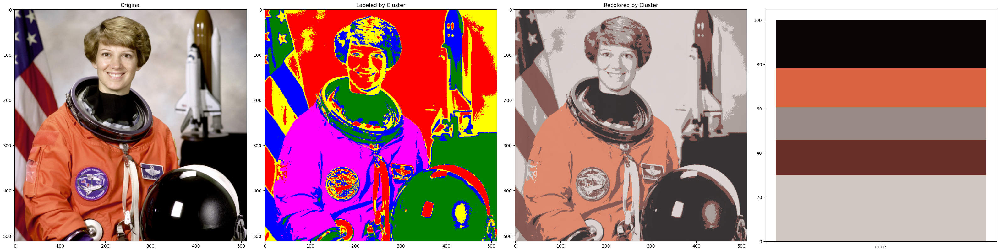

(300, 451) (300, 451, 3)


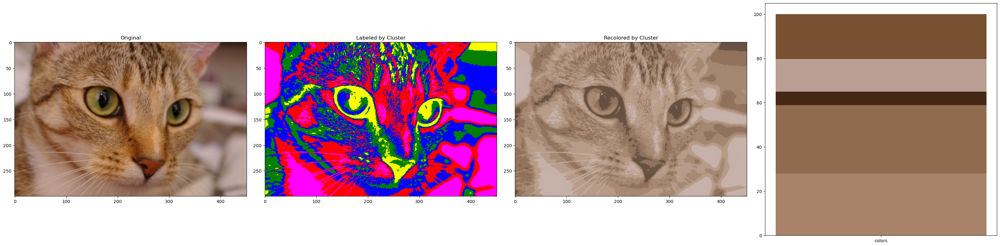

(427, 640) (427, 640, 3)


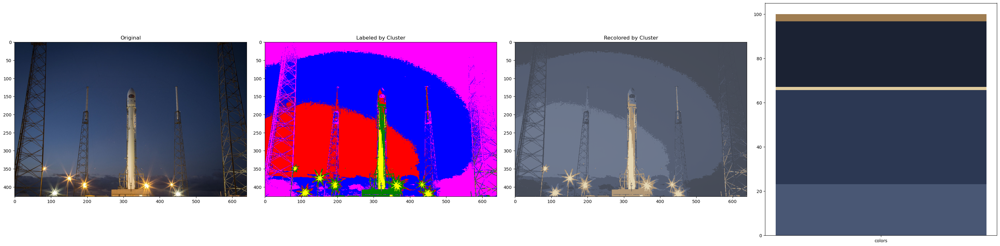

(370, 371) (370, 371, 3)


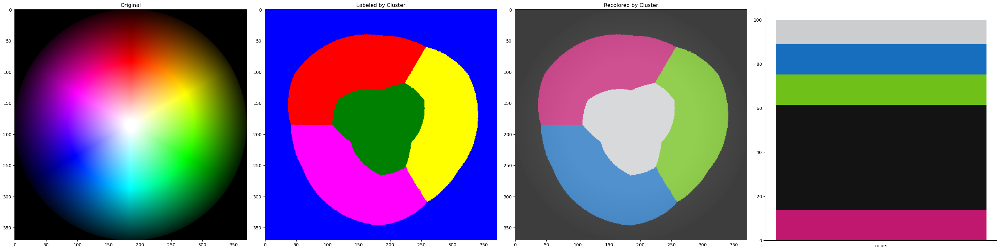

In [144]:
N_CLUSTERS = 5

images = [data.astronaut(), data.cat(), data.rocket(), data.colorwheel()]


for image in images:
    image = util.img_as_float(image)
    palette = extract_palette_kmeans_rgb(image)
    display_palette_sxs(image, palette)

(300, 247) (300, 247, 3)


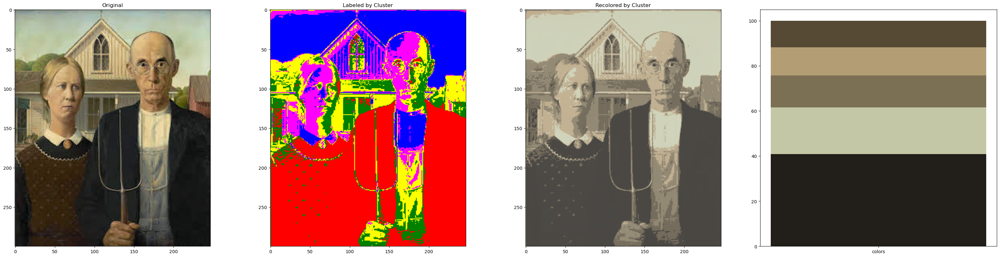

(153, 200) (153, 200, 3)


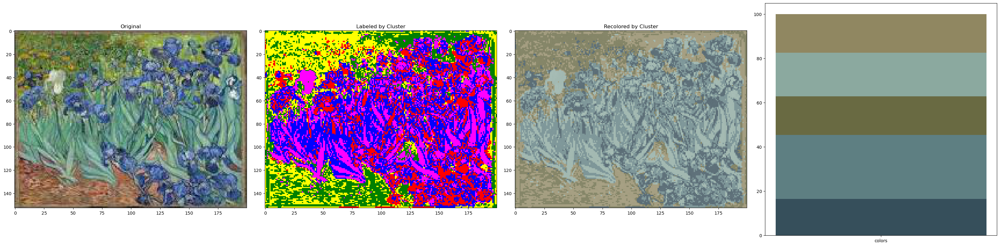

(300, 454) (300, 454, 3)


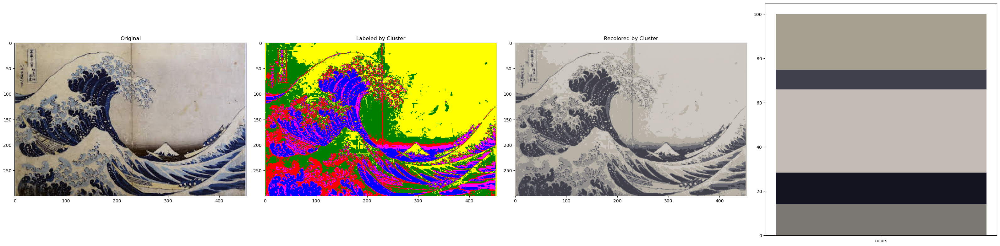

(300, 298) (300, 298, 3)


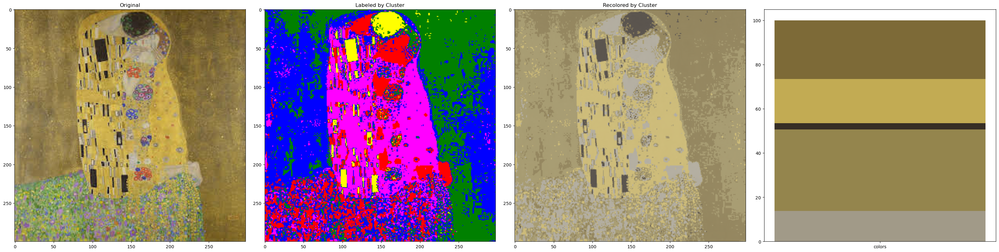

(152, 200) (152, 200, 3)


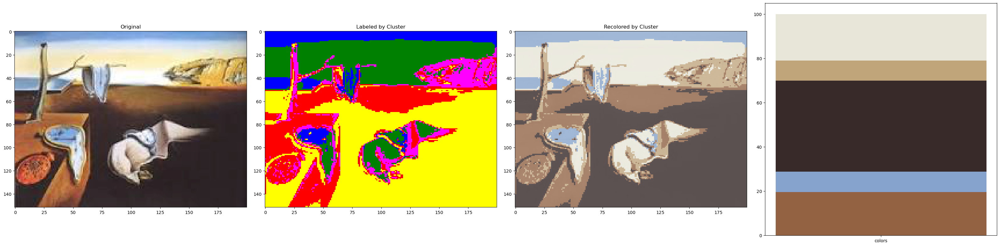

(250, 454) (250, 454, 3)


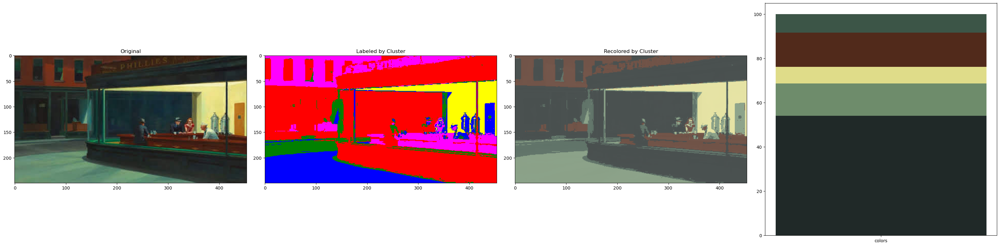

(300, 236) (300, 236, 3)


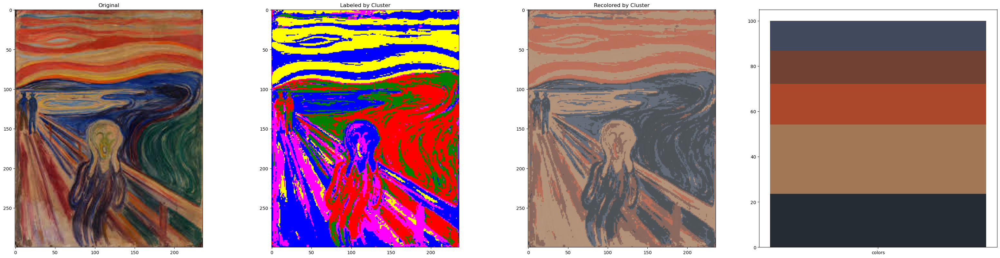

(300, 454) (300, 454, 3)


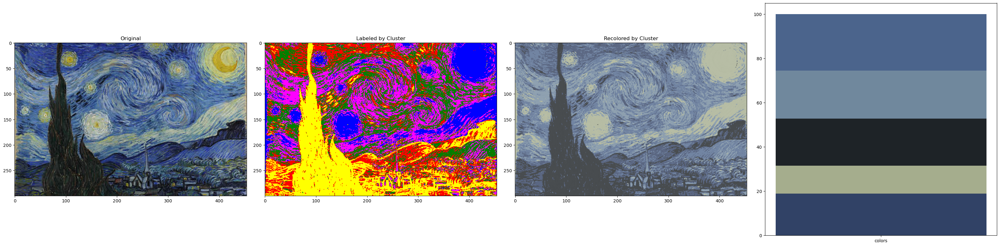

In [149]:
import os
from skimage.io import ImageCollection 

art_images = ImageCollection('art/*')
for image in art_images:
    image = util.img_as_float(image)
    palette = extract_palette_kmeans_rgb(image)
    display_palette_sxs(image, palette)

In [ ]:
# TODO: Try clustering in HSV instead of RGB.
# TODO: "Fill in" based on color selection. 